In [116]:
import json
import os

def get_attention_maps(folder_path):    
    attention_maps = {}
    for filename in os.listdir(folder_path):
        if filename.startswith("conversation_") and filename.endswith("_attention.json"):
            file_path = os.path.join(folder_path, filename)
            with open(file_path, "r") as f:
                data = json.load(f)
            # Extract instance id from filename
            instance_id = int(filename[len("conversation_"):].split("_attention.json")[0])
            attention_maps[instance_id] = data

    # For each instance, extract the list of tags in message_spans sorted by "start", and print the instance_id and sorted list.
    for instance_id, data in attention_maps.items():
        message_spans = data.get("message_spans", [])
        sorted_spans = sorted(message_spans, key=lambda span: span["start"])
        sorted_tags = [span["tag"] for span in sorted_spans]
        if 'layers' in data:
            cartridge_tags = [tag for tag in data["layers"][0]['tag_mass_per_token'].keys() if tag.lower().startswith("cartridge")]
            cartridge_tags = sorted(cartridge_tags)
            sorted_tags = cartridge_tags + sorted_tags
        attention_maps[instance_id]["sorted_tags"] = sorted_tags
    return attention_maps



In [117]:
attention_logs_dirs = {
    "cartridge_nov4_chatboxed": "/data/stalaei/logs/continual_learning/attention_eval/history_agent_cities_chatboxed_cartridge_nov4_chatboxed",
    "cartridge_nov4_chatboxed_mem_550": "/data/stalaei/logs/continual_learning/attention_eval/history_agent_cities_chatboxed_cartridge_nov4_chatboxed_mem_550",
    "cartridge_nov4_chatboxed_mem_600": "/data/stalaei/logs/continual_learning/attention_eval/history_agent_cities_chatboxed_cartridge_nov4_chatboxed_mem_600",
    "cartridge_nov6_chatboxed_mixed_dataset": "/data/stalaei/logs/continual_learning/attention_eval/history_agent_cities_chatboxed_cartridge_nov6_chatboxed_mixed_dataset-cache-step500",
    "cartridge_nov6_chatboxed_mixed_dataset_mem_550": "/data/stalaei/logs/continual_learning/attention_eval/history_agent_cities_chatboxed_cartridge_nov6_chatboxed_mixed_dataset-cache-step500_mem_550",
    "cartridge_nov6_chatboxed_mixed_dataset_mem_600": "/data/stalaei/logs/continual_learning/attention_eval/history_agent_cities_chatboxed_cartridge_nov6_chatboxed_mixed_dataset-cache-step500_mem_600",
    "mem_500": "/data/stalaei/logs/continual_learning/attention_eval/history_agent_cities_chatboxed_mem_500",
    "mem_700": "/data/stalaei/logs/continual_learning/attention_eval/history_agent_cities_chatboxed_mem_700",
    }

attention_maps = {
    key: get_attention_maps(path) for key, path in attention_logs_dirs.items()
}

In [118]:
attention_maps["mem_500"]

{0: {'conversation_index': 0,
  'metadata': {'num_layers': 3,
   'num_generated_tokens': 8,
   'cartridge_ids': [],
   'model_name': 'meta-llama/Llama-3.1-8B-Instruct'},
  'generated_tokens': {'token_ids': [59,
    80175,
    90,
    6219,
    655,
    35607,
    92,
    128009],
   'decoded': ['\\', 'boxed', '{', 'Am', 'ber', ' Dawn', '}', '<|eot_id|>']},
  'message_spans': [{'start': 0,
    'end': 310,
    'tag': 'system_prompt',
    'role': 'system',
    'message_index': 0},
   {'start': 310,
    'end': 368,
    'tag': 'memory_0_observation',
    'role': 'user',
    'message_index': 1},
   {'start': 368,
    'end': 381,
    'tag': 'memory_0_action',
    'role': 'assistant',
    'message_index': 2},
   {'start': 381,
    'end': 403,
    'tag': 'memory_0_feedback',
    'role': 'user',
    'message_index': 3},
   {'start': 403,
    'end': 461,
    'tag': 'memory_1_observation',
    'role': 'user',
    'message_index': 4},
   {'start': 461,
    'end': 475,
    'tag': 'memory_1_action',


In [119]:
def get_sorted_tag_mass_means(attention_map, layer_idx=0):
    """
    Given an attention map and a layer index, returns a list of (tag, mass) tuples
    from tag_mass_means, ordered by the 'sorted_tags' key in the attention map.
    """
    sorted_tags = attention_map.get("sorted_tags", [])
    layers = attention_map.get("layers", [])
    # Find the layer with the specified index
    layer = next((l for l in layers if l["layer_idx"] == layer_idx), None)
    if layer is None:
        return []
    tag_mass_means = layer.get("tag_mass_means", {})
    # Get masses in order of sorted_tags
    return [(tag, tag_mass_means.get(tag, 0.0)) for tag in sorted_tags]

def get_sorted_tag_mass_per_token(attention_map, layer_idx=0):
    """
    Given an attention maap and a layer index, returns a list of (tag, attention_weight_list) tuples
    from tag_mass_per_token, ordered by the 'sorted_tags' key in the attention map.
    Each tuple contains the tag and the corresponding list of per-token attention weights.
    """
    sorted_tags = attention_map.get("sorted_tags", [])
    layers = attention_map.get("layers", [])
    # Find the layer with the specified index
    layer = next((l for l in layers if l["layer_idx"] == layer_idx), None)
    if layer is None:
        return []
    tag_mass_per_token = layer.get("tag_mass_per_token", {})
    # Get per-token masses in order of sorted_tags
    return [(tag, tag_mass_per_token.get(tag, [])) for tag in sorted_tags]


layer_idxs = [0, 16, 31]
tags_attention_mass_means, tags_attention_mass_per_token = {}, {}

for key, attention_map_all_instances in attention_maps.items():
    tags_attention_mass_means[key] = {}
    tags_attention_mass_per_token[key] = {}
    for instance_id, attention_map in attention_map_all_instances.items():
        tags_attention_mass_means[key][instance_id] = {}
        tags_attention_mass_per_token[key][instance_id] = {}
        for layer_idx in layer_idxs:
            tags_attention_mass_means[key][instance_id][layer_idx] = get_sorted_tag_mass_means(attention_map, layer_idx=layer_idx)
            tags_attention_mass_per_token[key][instance_id][layer_idx] = get_sorted_tag_mass_per_token(attention_map, layer_idx=layer_idx)


In [120]:
tags_attention_mass_per_token.keys()

dict_keys(['cartridge_nov4_chatboxed', 'cartridge_nov4_chatboxed_mem_550', 'cartridge_nov4_chatboxed_mem_600', 'cartridge_nov6_chatboxed_mixed_dataset', 'cartridge_nov6_chatboxed_mixed_dataset_mem_550', 'cartridge_nov6_chatboxed_mixed_dataset_mem_600', 'mem_500', 'mem_700'])

In [121]:
from typing import List, Tuple

def merge_tags_attention_mass(
    tags_attention_mass_per_token: List[Tuple[str, List[float]]],
    ranges: List[Tuple[int, int]],
    separate_observation_action_feedback: bool = False
) -> List[Tuple[str, List[float]]]:
    """
    Merges the attention mass for tags of the form 'memory_X_{something}' whose X fall within each (start, end) range.
    Non-memory tags are preserved in their original order. Memory tags that fall in a range are summed elementwise and replaced by a single
    entry labeled "memory_{start}_{end}_merged" (or by subtype if separate_observation_action_feedback is True).

    Args:
        tags_attention_mass_per_token: List of (tag, [mass1, mass2,...]) as generated by get_sorted_tag_mass_per_token.
        ranges: List of (start, end) indices for memory blocks to merge, inclusive.
        separate_observation_action_feedback: If True, merges separately for each subtype; else merges all subtypes together in range.

    Returns:
        List of (tag, [mass1, mass2,...]) tuples, with memories merged as specified and other tags unchanged/in the same order.
    """
    import re
    from collections import defaultdict

    memory_tag_re = re.compile(r"memory_(\d+)_(observation|action|feedback)")
    memory_tags = defaultdict(dict)  # memory_idx -> subtype -> (tag, attn_list)
    other_entries = []  # not used, but left for clarity

    # Build index for all memory_X_{subtype} tags
    for tag, attn_list in tags_attention_mass_per_token:
        m = memory_tag_re.fullmatch(tag)
        if m:
            idx = int(m.group(1))
            subtype = m.group(2)
            memory_tags[idx][subtype] = (tag, attn_list)

    merged_memories = {}  # tag -> (merged_attention_array)
    if separate_observation_action_feedback:
        # For each range, sum all memory_X_{something} entries for each subtype over that range
        for range_start, range_end in ranges:
            for subtype in ["observation", "action", "feedback"]:
                relevant = []
                for i in range(range_start, range_end + 1):
                    entry = memory_tags.get(i, {}).get(subtype, None)
                    if entry:
                        relevant.append(entry[1])
                if relevant:
                    merged = [sum(vals) for vals in zip(*relevant)]
                    tag = f"memory_{range_start}_{range_end}_{subtype}_merged"
                    merged_memories[tag] = merged
    else:
        # For each range, sum ALL memory_X_{subtype} (all subtypes) entries in the range, elementwise
        for range_start, range_end in ranges:
            relevant = []
            for i in range(range_start, range_end + 1):
                for subtype in ["observation", "action", "feedback"]:
                    entry = memory_tags.get(i, {}).get(subtype, None)
                    if entry:
                        relevant.append(entry[1])
            if relevant:
                merged = [sum(vals) for vals in zip(*relevant)]
                tag = f"memory_{range_start}_{range_end}_merged"
                merged_memories[tag] = merged

    # Now build the result in original order, inserting merged tags at first occurrence of any member of range/subtype
    merged_list = []
    used_range_tags = set()
    already_merged_idxs = set()  # Only for not double-replacing in this loop

    for tag, attn_list in tags_attention_mass_per_token:
        m = memory_tag_re.fullmatch(tag)
        if m:
            idx = int(m.group(1))
            subtype = m.group(2)
            found_merge = False
            for range_start, range_end in ranges:
                if range_start <= idx <= range_end:
                    if separate_observation_action_feedback:
                        merged_tag = f"memory_{range_start}_{range_end}_{subtype}_merged"
                        if merged_tag not in used_range_tags and merged_tag in merged_memories:
                            merged_list.append((merged_tag, merged_memories[merged_tag]))
                            used_range_tags.add(merged_tag)
                        found_merge = True
                    else:
                        merged_tag = f"memory_{range_start}_{range_end}_merged"
                        # Only emit merged at first memory_X_{subtype} within this range
                        if merged_tag not in used_range_tags and merged_tag in merged_memories:
                            merged_list.append((merged_tag, merged_memories[merged_tag]))
                            used_range_tags.add(merged_tag)
                        found_merge = True
                    break  # Only need to check first matching range
            if found_merge:
                continue  # skip original
            else:
                # memory_X_{subtype} not in any range: preserve as-is
                merged_list.append((tag, attn_list))
        else:
            # Non-memory: preserve as-is
            merged_list.append((tag, attn_list))
    return merged_list

merged_tags_attention_mass_per_token = {}
ranges = [(0, 499), (500, 699)]
for logs_id in tags_attention_mass_per_token:
    merged_tags_attention_mass_per_token[logs_id] = {}
    for instance_id in tags_attention_mass_per_token[logs_id]:
        merged_tags_attention_mass_per_token[logs_id][instance_id] = {}
        for layer_idx in tags_attention_mass_per_token[logs_id][instance_id]:
            merged_tags_attention_mass_per_token[logs_id][instance_id][layer_idx] = merge_tags_attention_mass(
                tags_attention_mass_per_token[logs_id][instance_id][layer_idx],
                ranges
            )

In [122]:
merged_tags_attention_mass_per_token

{'cartridge_nov4_chatboxed': {0: {0: [('cartridge_nov4_chatboxed',
     [0.24257968366146088,
      0.27187129855155945,
      0.3121061325073242,
      0.2499384880065918,
      0.30948933959007263,
      0.32943204045295715,
      0.3322949707508087,
      0.25309115648269653]),
    ('system_prompt',
     [0.3263876736164093,
      0.2556362748146057,
      0.23672643303871155,
      0.24943147599697113,
      0.2485802173614502,
      0.2246873378753662,
      0.2541828453540802,
      0.23815187811851501]),
    ('current_observation',
     [0.28611689805984497,
      0.2337423861026764,
      0.22644175589084625,
      0.23279047012329102,
      0.2343670129776001,
      0.213795006275177,
      0.22721007466316223,
      0.22271764278411865]),
    ('generation_prompt',
     [0.08146610856056213,
      0.10868968069553375,
      0.07096197456121445,
      0.053876325488090515,
      0.03777199238538742,
      0.031078997999429703,
      0.03441673889756203,
      0.0536395199596881

In [128]:
import matplotlib.pyplot as plt
import numpy as np

import textwrap

def plot_merged_tags_attention_mass_all_logs(
    merged_tags_attention_mass_per_token,
    instance_ids,
    layer_idxs,
    token_idxs,
    figsize=(10, 4),
    font_size=6,
    max_tag_len=18,           # Maximum length before splitting tag
    tag_wrap_width=20,        # Wrap tag to this many chars per line
):
    """
    For each logs_id in merged_tags_attention_mass_per_token, averages mass values across all specified instance_ids and layer_idxs 
    and all specified token_idxs, and plots a bar plot.

    Args:
        merged_tags_attention_mass_per_token: dict mapping logs_id -> instance_id -> layer_idx -> tag-mass lists
        instance_ids: list of instance_ids (int)
        layer_idxs: list of layer_idxs (int)
        token_idxs: list of token indices (int) within tag attn_list to aggregate over
        figsize: matplotlib figure size for each plot
        font_size: font size for text in the plots
        max_tag_len: tag length above which to wrap into multiple lines
        tag_wrap_width: width (in characters) per line for the tag
    """
    if not isinstance(instance_ids, (list, tuple)):
        instance_ids = [instance_ids]
    if not isinstance(layer_idxs, (list, tuple)):
        layer_idxs = [layer_idxs]
    if not isinstance(token_idxs, (list, tuple)):
        token_idxs = [token_idxs]
    for logs_id in merged_tags_attention_mass_per_token:
        tag2masses = {}
        found = False
        for instance_id in instance_ids:
            if instance_id not in merged_tags_attention_mass_per_token[logs_id]:
                continue
            for layer_idx in layer_idxs:
                if layer_idx not in merged_tags_attention_mass_per_token[logs_id][instance_id]:
                    continue
                found = True
                attention_masses = merged_tags_attention_mass_per_token[logs_id][instance_id][layer_idx]
                for tag, attn_list in attention_masses:
                    # Make a list of all token masses for the given token_idxs that are in range
                    selected_masses = [attn_list[tidx] for tidx in token_idxs if tidx < len(attn_list)]
                    if not selected_masses:
                        continue
                    if tag not in tag2masses:
                        tag2masses[tag] = []
                    tag2masses[tag].extend(selected_masses)
        if not found or not tag2masses:
            print(f"No data found for logs_id={logs_id} for given instance_ids or layer_idxs")
            continue
        tags = sorted(tag2masses.keys())

        # Wrap/tag splitting step for x-ticks
        def wrap_tag(t):
            if len(t) > max_tag_len:
                return '\n'.join(textwrap.wrap(t, width=tag_wrap_width))
            else:
                return t
        tags_display = [wrap_tag(tag) for tag in tags]

        avg_masses = []
        std_masses = []
        for tag in tags:
            arr = np.array(tag2masses[tag])
            avg_masses.append(arr.mean())
            std_masses.append(arr.std())
        plt.figure(figsize=figsize)
        bars = plt.bar(tags_display, avg_masses, yerr=std_masses, capsize=3)
        plt.xlabel("Tag", fontsize=font_size)
        plt.ylabel("Average Attention Mass", fontsize=font_size)
        plt.title(
            f"logs_id={logs_id}\nAvg across instance_ids={instance_ids}, layer_idxs={layer_idxs} - Tokens {token_idxs}",
            fontsize=font_size + 1
        )
        plt.xticks(rotation=0, ha='center', fontsize=font_size)
        plt.yticks(fontsize=font_size)
        # Add value labels
        for bar, avg, std in zip(bars, avg_masses, std_masses):
            height = bar.get_height()
            plt.text(
                bar.get_x() + bar.get_width() / 2,
                height,
                f"{avg:.4f}±{std:.4f}",
                ha='center',
                va='bottom',
                fontsize=font_size,
                rotation=0
            )
        plt.tight_layout()
        plt.show()


Plotting for instance_ids=[0, 1, 2, 3]


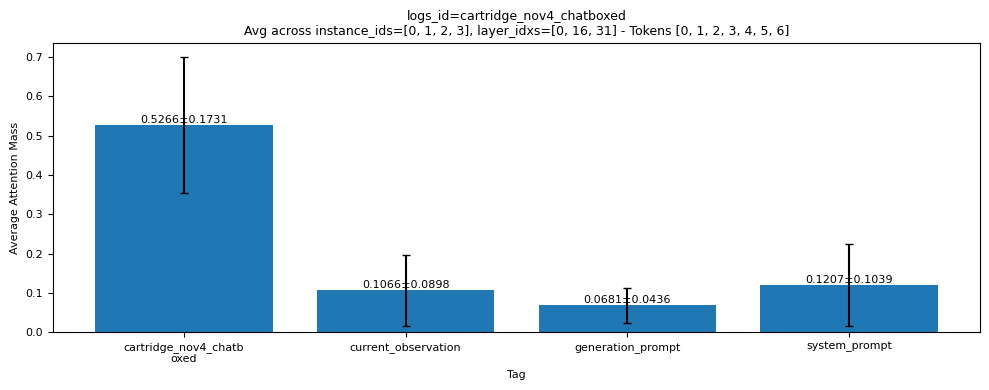

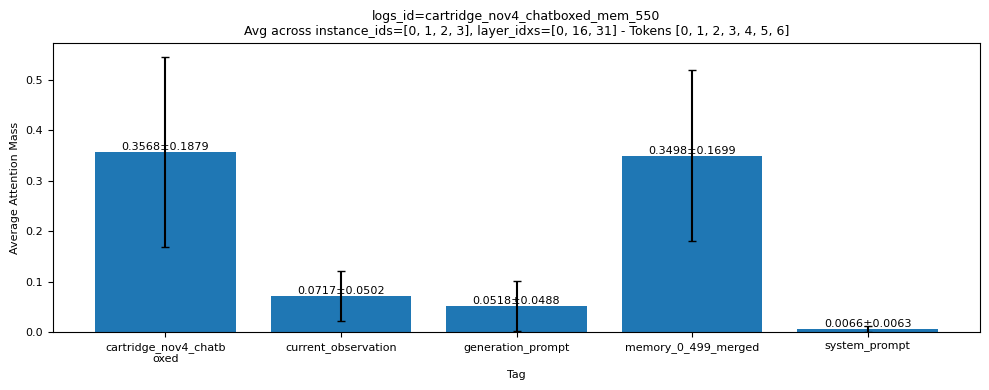

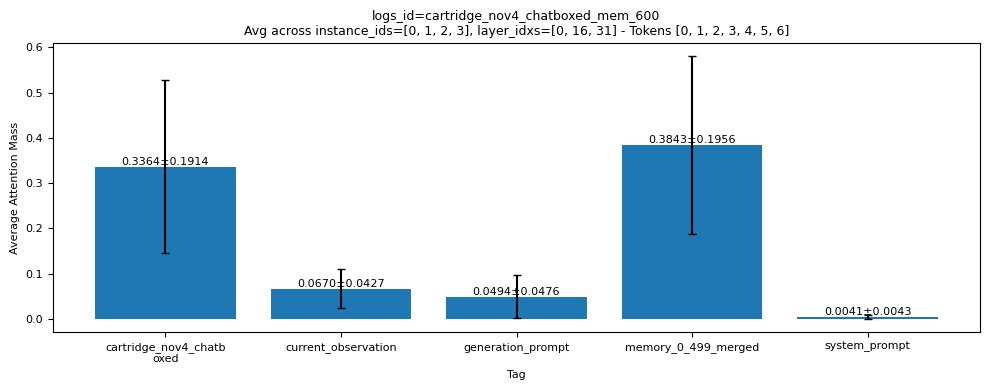

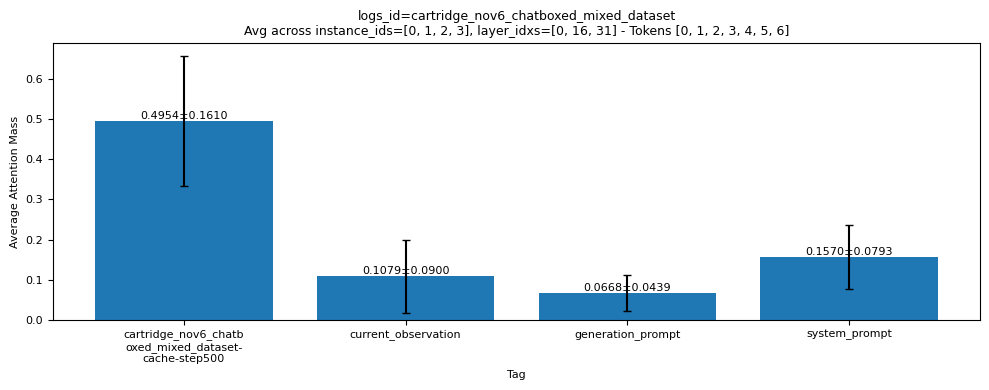

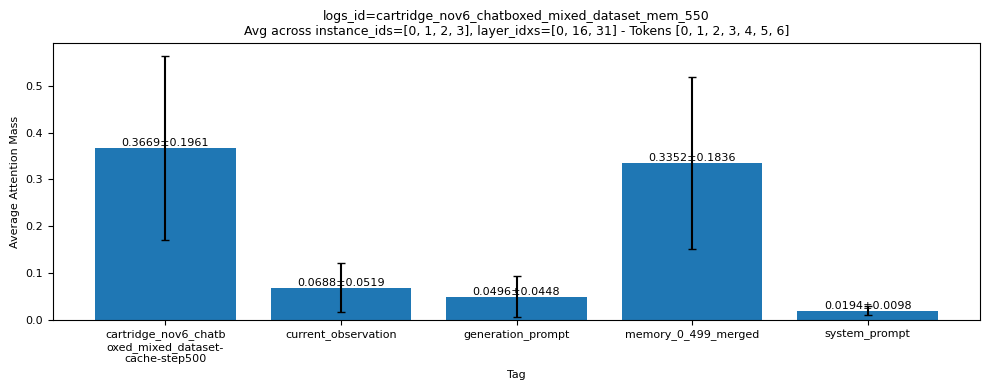

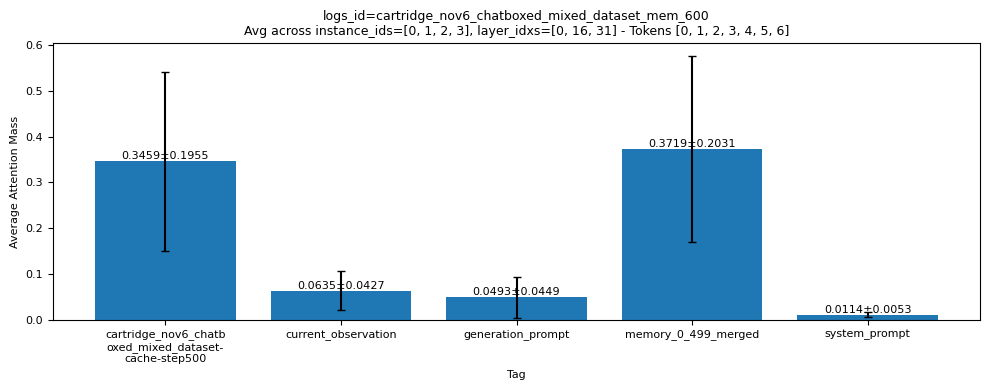

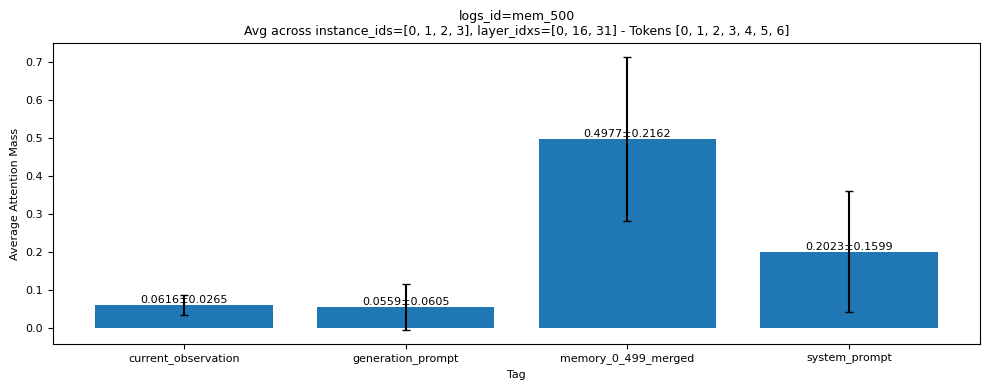

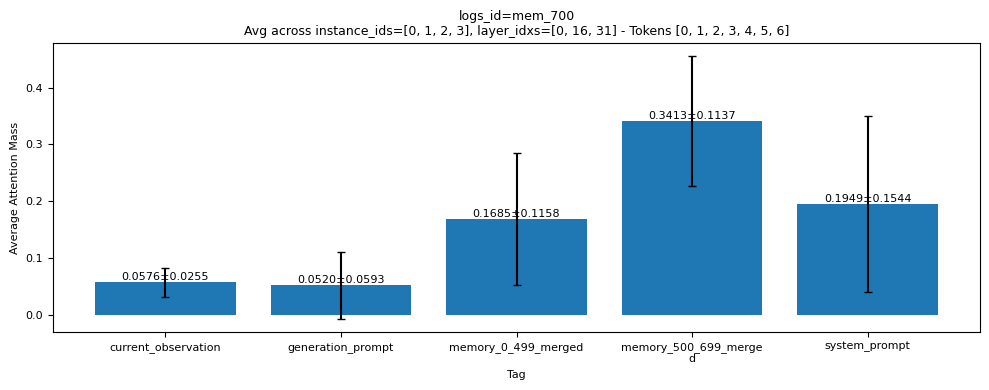

Plotting for instance_ids=[20, 21, 22, 23]


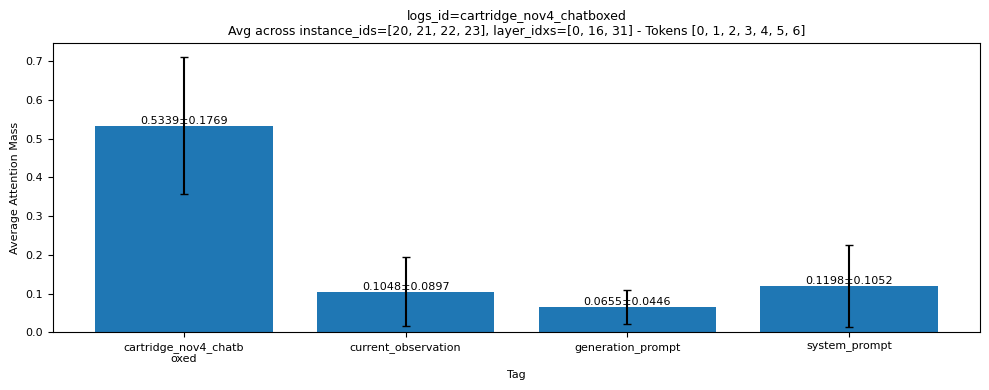

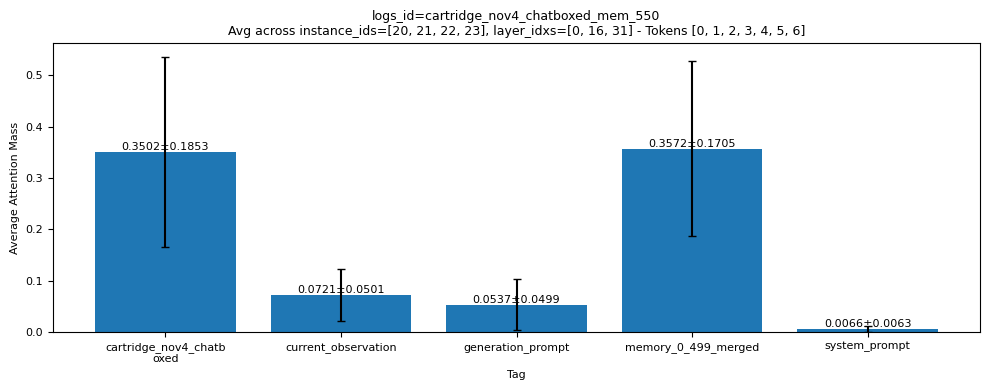

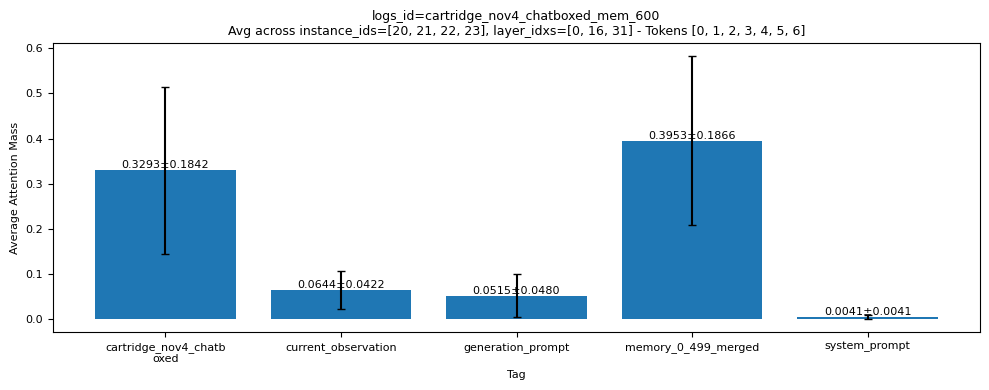

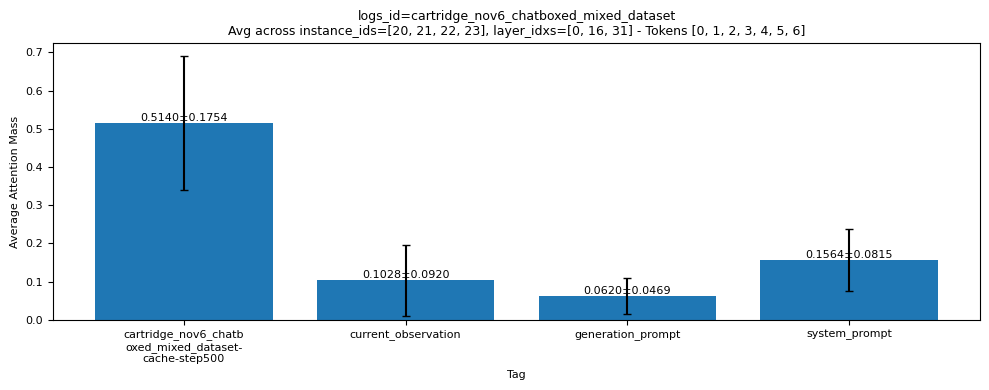

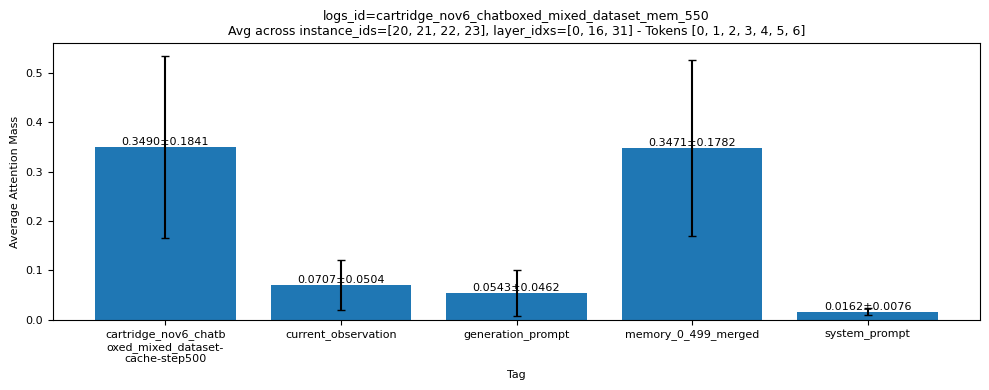

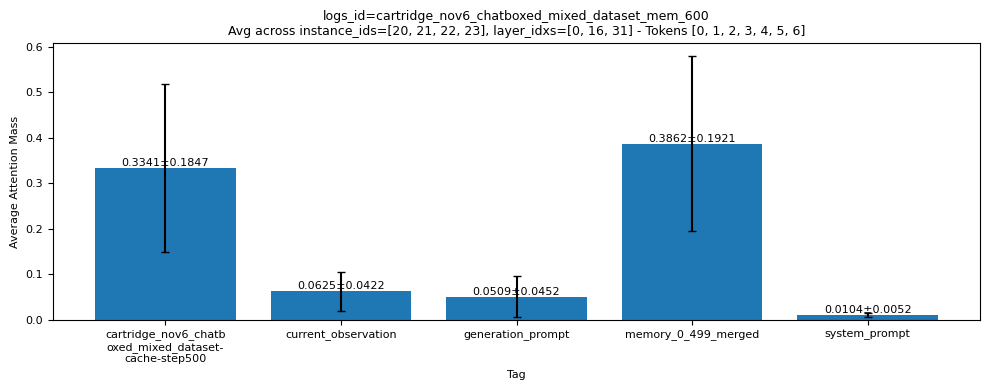

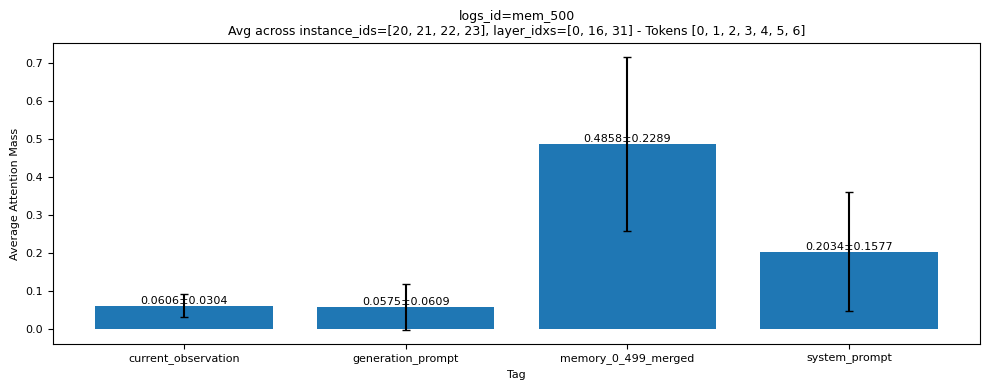

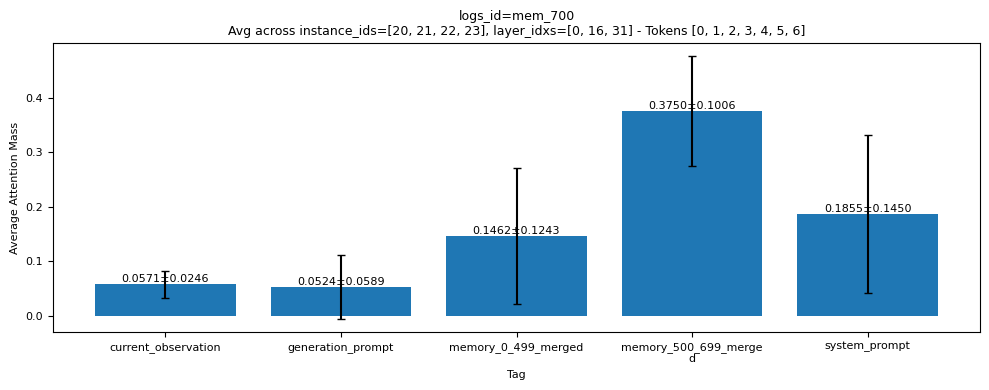

In [129]:
layer_idxs = [0, 16, 31]
token_idxs = [0,1,2,3,4,5,6]

instance_ids = [0,1,2,3]
print(f"Plotting for instance_ids={instance_ids}")
plot_merged_tags_attention_mass_all_logs(
    merged_tags_attention_mass_per_token,
    instance_ids=instance_ids,
    layer_idxs=layer_idxs,
    token_idxs=token_idxs,   # Now a list of ints
    font_size=8
)

instance_ids = [20,21,22,23]
print(f"Plotting for instance_ids={instance_ids}")
plot_merged_tags_attention_mass_all_logs(
    merged_tags_attention_mass_per_token,
    instance_ids=[20,21,22,23],
    layer_idxs=layer_idxs,
    token_idxs=token_idxs,   # Now a list of ints
    font_size=8
)
